In [1]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [2]:
!apt-get install unrar

!unrar x /content/SeniorProject.rar /content/SeniorProject/


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/SeniorProject.rar

Creating    /content/SeniorProject                                    OK
Creating    /content/SeniorProject/CLASSROOM                          OK
Extracting  /content/SeniorProject/CLASSROOM/IMG_0450.jpg                  0%  OK 
Extracting  /content/SeniorProject/CLASSROOM/IMG_0451.jpg                  0%  OK 
Extracting  /content/SeniorProject/CLASSROOM/IMG_0452.jpg                  0%  OK 
Extracting  /content/SeniorProject/CLASSROOM/IMG_0453.jpg                  1%  OK 
Extracting  /content/SeniorProject/CLASSROOM/IMG_0454.jpg                  1%  OK 
Extracting  /content/SeniorProject/CLASSROOM/IMG_0455.jpg        

In [3]:
!pip install mtcnn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 45.3 MB/s eta 0:00:00


In [4]:
import cv2 as cv
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [57]:
img = cv.imread("/content/SeniorProject/CLASSROOM/IMG_0452.jpg")
# opencv BGR channel format and plt reads images as RGB channel format

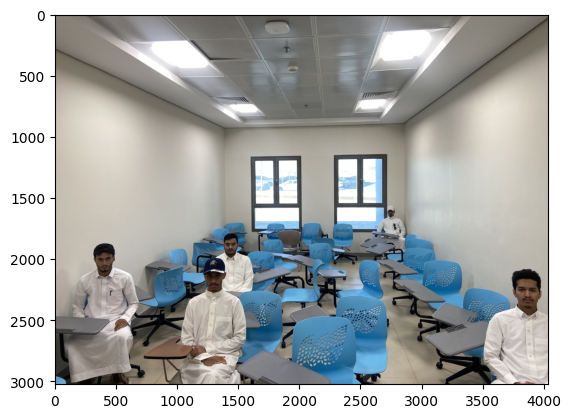

In [58]:
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img) # RGB

In [59]:
from mtcnn.mtcnn import MTCNN

detector = MTCNN()
results = detector.detect_faces(img)

In [60]:
results

[{'box': [3769, 2161, 180, 235],
  'confidence': 0.9999523162841797,
  'keypoints': {'nose': [3863, 2299],
   'mouth_right': [3899, 2341],
   'right_eye': [3907, 2257],
   'left_eye': [3819, 2255],
   'mouth_left': [3828, 2340]}},
 {'box': [1225, 2079, 147, 181],
  'confidence': 0.9999451637268066,
  'keypoints': {'nose': [1294, 2188],
   'mouth_right': [1327, 2214],
   'right_eye': [1331, 2144],
   'left_eye': [1263, 2143],
   'mouth_left': [1267, 2214]}},
 {'box': [335, 1945, 131, 162],
  'confidence': 0.9997342228889465,
  'keypoints': {'nose': [404, 2046],
   'mouth_right': [432, 2066],
   'right_eye': [432, 2003],
   'left_eye': [372, 2007],
   'mouth_left': [377, 2069]}},
 {'box': [2721, 1595, 50, 59],
  'confidence': 0.9992504715919495,
  'keypoints': {'nose': [2743, 1627],
   'mouth_right': [2756, 1640],
   'right_eye': [2756, 1613],
   'left_eye': [2733, 1613],
   'mouth_left': [2736, 1640]}},
 {'box': [1384, 1837, 100, 123],
  'confidence': 0.999249279499054,
  'keypoints': {

In [61]:
x,y,w,h = results[0]['box']

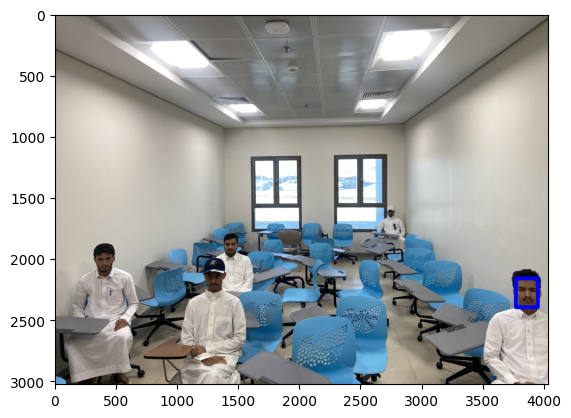

In [62]:
img = cv.rectangle(img, (x,y), (x+w, y+h), (0,0,255), 30)
plt.imshow(img)

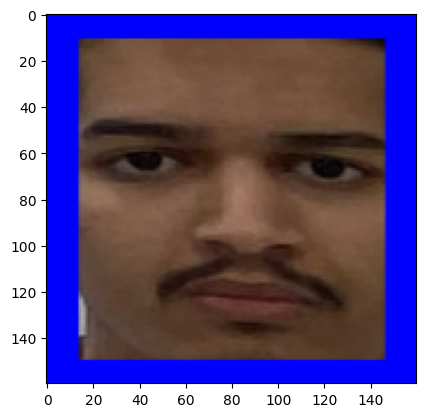

In [63]:
my_face = img[y:y+h, x:x+w]
#Facenet takes as input 160x160
my_face = cv.resize(my_face, (160,160))
plt.imshow(my_face)

array([[[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]],

       ...,

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255]]], dtype=uint8)
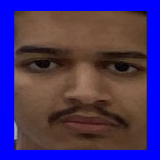

In [66]:
my_face

# Automate the preprocessing


In [13]:
class FACELOADING:
    def __init__(self, directory):
        self.directory = directory
        self.target_size = (160,160)
        self.X = []
        self.Y = []
        self.detector = MTCNN()


    def extract_face(self, filename):
        img = cv.imread(filename)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        x,y,w,h = self.detector.detect_faces(img)[0]['box']
        x,y = abs(x), abs(y)
        face = img[y:y+h, x:x+w]
        face_arr = cv.resize(face, self.target_size)
        return face_arr


    def load_faces(self, dir):
        FACES = []
        for im_name in os.listdir(dir):
            try:
                path = dir + im_name
                single_face = self.extract_face(path)
                FACES.append(single_face)
            except Exception as e:
                pass
        return FACES

    def load_classes(self):
        for sub_dir in os.listdir(self.directory):
            path = self.directory +'/'+ sub_dir+'/'
            FACES = self.load_faces(path)
            labels = [sub_dir for _ in range(len(FACES))]
            print(f"Loaded successfully: {len(labels)}")
            self.X.extend(FACES)
            self.Y.extend(labels)

        return np.asarray(self.X), np.asarray(self.Y)


    def plot_images(self):
        plt.figure(figsize=(18,16))
        for num,image in enumerate(self.X):
            ncols = 3
            nrows = len(self.Y)//ncols + 1
            plt.subplot(nrows,ncols,num+1)
            plt.imshow(image)
            plt.axis('off')

In [14]:
faceloading = FACELOADING("/content/SeniorProject/students_dataset")
X, Y = faceloading.load_classes()

Loaded successfully: 53
Loaded successfully: 56
Loaded successfully: 54
Loaded successfully: 50
Loaded successfully: 60
Loaded successfully: 52


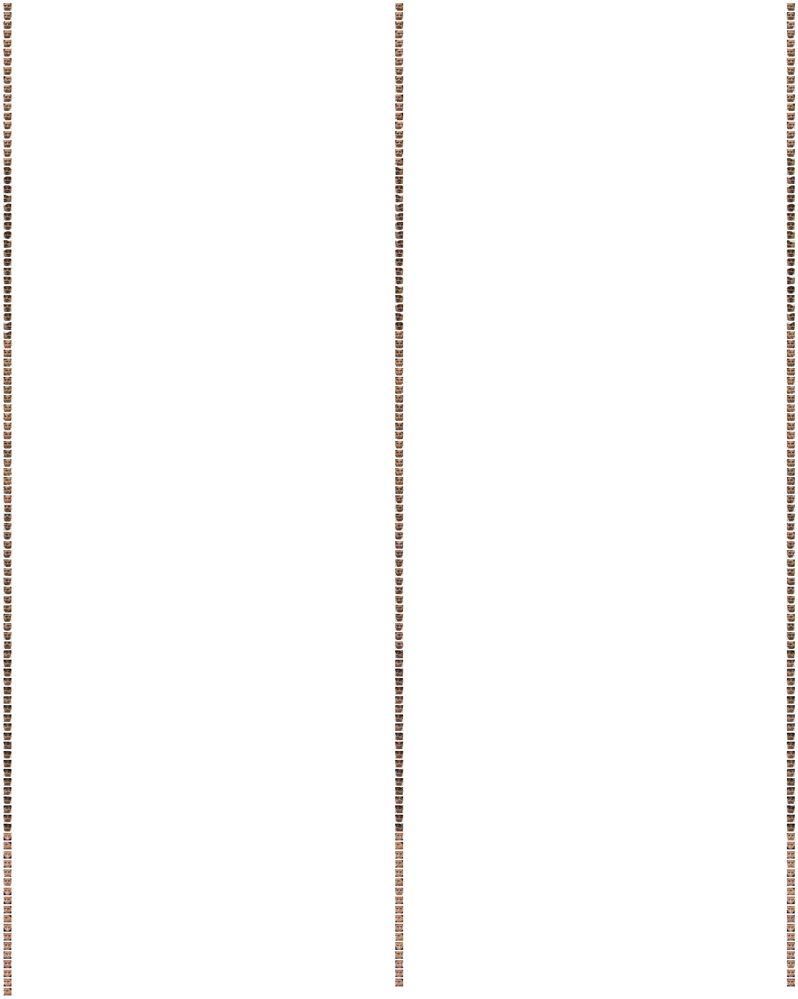

In [17]:
plt.figure(figsize=(40,36))
for num,image in enumerate(X):
    ncols = 3
    nrows = len(Y)//ncols + 1
    plt.subplot(nrows,ncols,num+1)
    plt.imshow(image)
    plt.axis('off')

# FaceNet part

In [18]:
!pip install keras-facenet

  Preparing metadata (setup.py) ... done
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10368 sha256=18779b78688f1dfa9f75b1917909c14216e65c2f4c3a901878e05481285beb3b
  Stored in directory: /root/.cache/pip/wheels/1d/d8/a9/85cf04ea29321d2afcb82c0caaafdca9195385f9d68cbc7185
Successfully built keras-facenet


In [19]:
from keras_facenet import FaceNet
embedder = FaceNet()

def get_embedding(face_img):
    face_img = face_img.astype('float32') # 3D(160x160x3)
    face_img = np.expand_dims(face_img, axis=0)
    # 4D (Nonex160x160x3)
    yhat= embedder.embeddings(face_img)
    return yhat[0] # 512D image (1x1x512)

In [45]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define augmentation settings
data_gen = ImageDataGenerator(
    zoom_range=0.2,              # Zoom in/out by 20%
    width_shift_range=0.2,       # Shift horizontally by 20%
    height_shift_range=0.2,      # Shift vertically by 20%
    brightness_range=[0.8, 1.2], # Adjust brightness between 80%-120%
    horizontal_flip=True         # Flip images horizontally
)

# Augment the validation dataset
augmented_X = []
augmented_Y = []

for i, img in enumerate(X):
    img = np.expand_dims(img, axis=0)  # Expand dimensions for augmentation
    augmented_images = data_gen.flow(img, batch_size=1)

    # Generate 5 augmented images per original image
    for _ in range(5):
        aug_img = next(augmented_images)[0]  # Extract the augmented image
        augmented_X.append(aug_img)
        augmented_Y.append(Y[i])

# Convert to numpy arrays
augmented_X = np.array(augmented_X)
augmented_Y = np.array(augmented_Y)

# Combine original and augmented datasets
X_combined = np.concatenate((X, augmented_X))
Y_combined = np.concatenate((Y, augmented_Y))

print(f"Original dataset size: {len(X)}")
print(f"Augmented dataset size: {len(augmented_X)}")
print(f"Combined dataset size: {len(X_combined)}")


Original dataset size: 325
Augmented dataset size: 1625
Combined dataset size: 1950


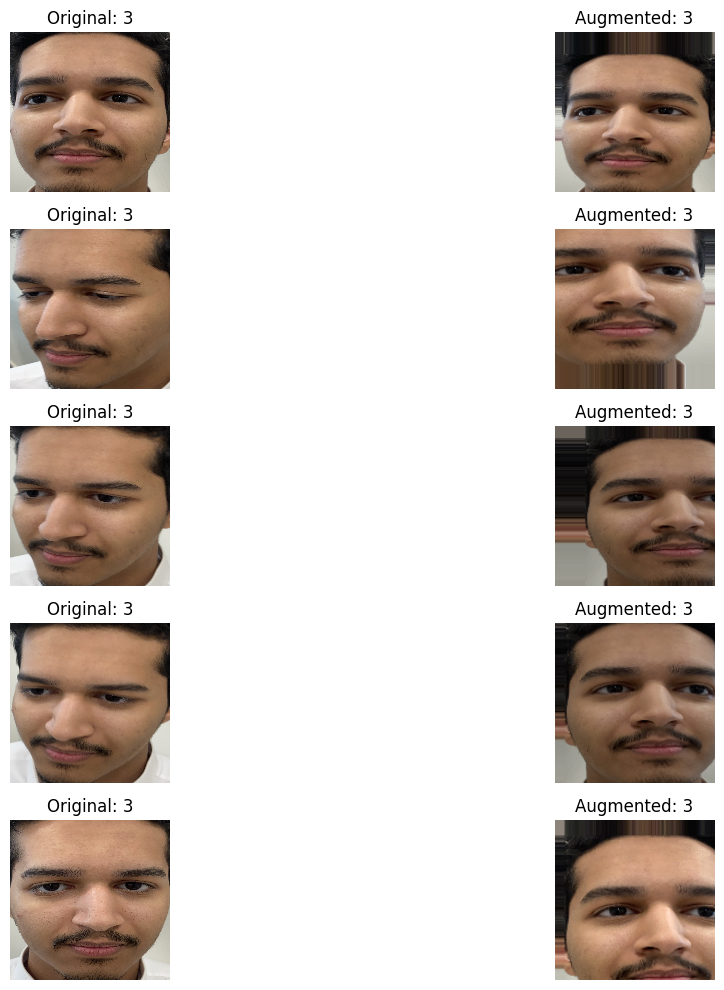

In [46]:
import matplotlib.pyplot as plt

# Function to visualize augmented images
def visualize_augmented_data(original, augmented, labels, num_images=5):
    plt.figure(figsize=(15, 10))

    for i in range(num_images):
        # Original image
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(original[i].astype('uint8'))
        plt.title(f"Original: {labels[i]}")
        plt.axis('off')

        # Augmented image
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(augmented[i].astype('uint8'))
        plt.title(f"Augmented: {labels[i]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize 5 examples of original and augmented data
visualize_augmented_data(X[:5], augmented_X[:5], Y[:5])


In [47]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
encoder.fit(Y_combined)
Y_combined = encoder.transform(Y_combined)


In [48]:
EMBEDDED_X = []

for img in X_combined:
    EMBEDDED_X.append(get_embedding(img))

EMBEDDED_X = np.asarray(EMBEDDED_X)


1/1 [==============================] - 0s 58ms/step


In [21]:
np.savez_compressed('faces_embeddings_done_6classes.npz', EMBEDDED_X, Y)

# SVM model


In [49]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
encoder.fit(Y)
Y = encoder.transform(Y)

Text(0, 0.5, '3')

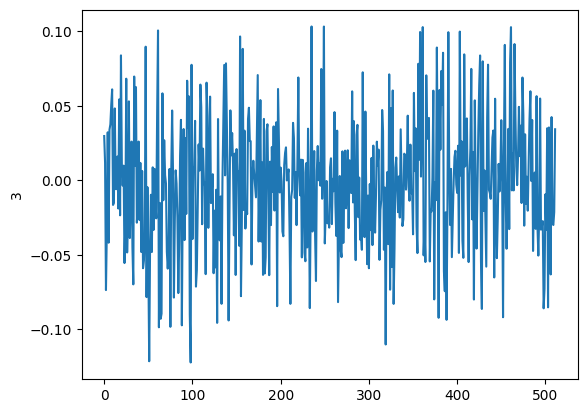

In [50]:
plt.plot(EMBEDDED_X[0])
plt.ylabel(Y[0])

In [51]:
Y

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [53]:
from sklearn.model_selection import train_test_split

# Use the combined dataset (augmented + original)
X_train, X_test, Y_train, Y_test = train_test_split(EMBEDDED_X, Y_combined, shuffle=True, random_state=17)

print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")


Training set size: 1462
Test set size: 488


In [54]:
from sklearn.svm import SVC

model = SVC(kernel='linear', probability=True)
model.fit(X_train, Y_train)

print("SVM model trained successfully!")


SVM model trained successfully!


In [28]:
ypreds_train = model.predict(X_train)
ypreds_test = model.predict(X_test)

In [55]:
from sklearn.metrics import accuracy_score

# Predict on training and test sets
ypreds_train = model.predict(X_train)
ypreds_test = model.predict(X_test)

# Compute accuracy
train_accuracy = accuracy_score(Y_train, ypreds_train)
test_accuracy = accuracy_score(Y_test, ypreds_test)

print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
print(f"Testing Accuracy: {test_accuracy * 100:.2f}%")


Training Accuracy: 100.00%
Testing Accuracy: 100.00%


In [30]:
accuracy_score(Y_test,ypreds_test)

1.0

In [67]:
t_im = cv.imread("/content/SeniorProject/students_dataset/Jawad/IMG_0321.jpg")
t_im = cv.cvtColor(t_im, cv.COLOR_BGR2RGB)
x,y,w,h = detector.detect_faces(t_im)[0]['box']

In [68]:
t_im = t_im[y:y+h, x:x+w]
t_im = cv.resize(t_im, (160,160))
test_im = get_embedding(t_im)

1/1 [==============================] - 0s 64ms/step


In [69]:
test_im = [test_im]
ypreds = model.predict(test_im)

In [73]:
ypreds

array([2])

In [74]:
encoder.inverse_transform(ypreds)

array([2])

In [40]:
import pickle
#save the model
with open('svmFRAS_model_160x160.pkl','wb') as f:
    pickle.dump(model,f)

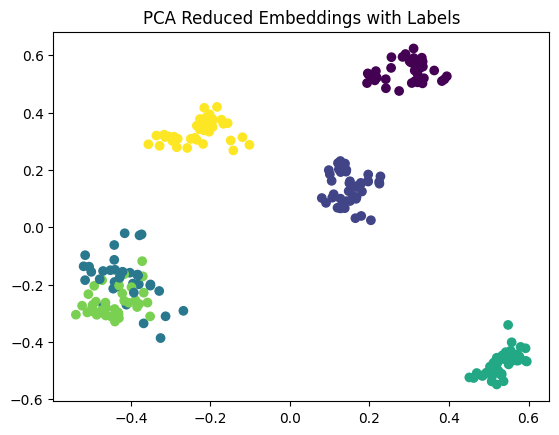

In [41]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(X_train)

plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=Y_train, cmap='viridis')
plt.title('PCA Reduced Embeddings with Labels')
plt.show()


In [75]:
from mtcnn.mtcnn import MTCNN
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def detect_faces(image_path):
    # Load the image
    image = Image.open(image_path).convert('RGB')
    pixels = np.asarray(image)

    # Initialize the MTCNN detector
    detector = MTCNN()
    results = detector.detect_faces(pixels)

    # Draw bounding boxes around detected faces
    plt.imshow(image)
    ax = plt.gca()

    for result in results:
        x, y, width, height = result['box']
        x, y = abs(x), abs(y)  # Ensure coordinates are positive
        rect = plt.Rectangle((x, y), width, height, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)

    plt.axis('off')
    plt.show()

    return results


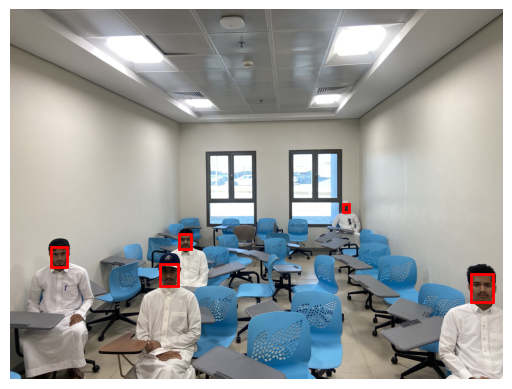

In [76]:
# Test the function
image_path = '/content/SeniorProject/CLASSROOM/IMG_0452.jpg'
detected_faces = detect_faces(image_path)


In [77]:
def crop_faces(image_path, results, required_size=(160, 160)):
    image = Image.open(image_path).convert('RGB')
    pixels = np.asarray(image)
    faces = []

    for result in results:
        x, y, width, height = result['box']
        x, y = abs(x), abs(y)  # Ensure coordinates are positive
        x2, y2 = x + width, y + height
        face = pixels[y:y2, x:x2]
        face_image = Image.fromarray(face).resize(required_size)
        faces.append(np.asarray(face_image))

    return np.array(faces)


In [78]:
# Crop the detected faces
cropped_faces = crop_faces(image_path, detected_faces)
print(f"Number of faces detected: {len(cropped_faces)}")


Number of faces detected: 5


In [84]:
# Generate embeddings for the detected faces
def get_face_embeddings(embedder, faces):
    embeddings = []
    for face in faces:
        face = face.astype('float32')
        face = np.expand_dims(face, axis=0)  # Expand dimensions for batch size
        yhat = embedder.embeddings(face)  # Generate embeddings
        embeddings.append(yhat[0])  # Extract the 512D vector
    return np.array(embeddings)

# Call the function with your cropped faces
face_embeddings = get_face_embeddings(embedder, cropped_faces)
print(f"Generated embeddings for {len(face_embeddings)} faces.")


1/1 [==============================] - 0s 61ms/step
Generated embeddings for 5 faces.


In [99]:
# Predict identities
predicted_labels = model.predict(face_embeddings)

# Decode the predicted labels
predicted_names = encoder.inverse_transform(predicted_labels)

# Print the results
print("Predicted identities for the faces:", predicted_names)


Predicted identities for the faces: [3 1 5 4 2]


Raw Predicted Labels: [3 1 5 4 2]


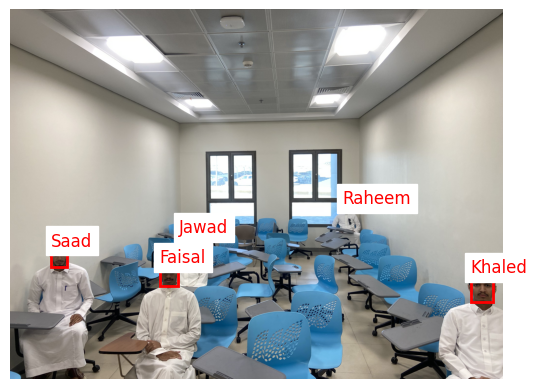

In [102]:
def visualize_predictions(image_path, results, predicted_names):
    from matplotlib.patches import Rectangle
    from PIL import Image
    import matplotlib.pyplot as plt

    # Load the image
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    ax = plt.gca()

    # Loop through results and names to draw bounding boxes and display names
    for result, name in zip(results, predicted_names):
        # Extract bounding box coordinates
        x, y, width, height = result['box']
        x, y = abs(x), abs(y)  # Ensure no negative coordinates

        # Draw the bounding box
        rect = Rectangle((x, y), width, height, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)

        # Draw the predicted name above the bounding box
        plt.text(x, y - 10, name, color='red', fontsize=12, backgroundcolor='white')

    plt.axis('off')  # Remove axis
    plt.show()

# Visualize predictions
visualize_predictions(image_path, detected_faces, predicted_names)


In [88]:
predicted_names = encoder.inverse_transform(predicted_labels)


In [90]:
x, y = abs(x), abs(y)


In [101]:
import os
from sklearn.preprocessing import LabelEncoder

# Step 1: Initialize the encoder with correct class names
dataset_dir = "/content/SeniorProject/students_dataset"
class_names = sorted(os.listdir(dataset_dir))  # Ensure consistent order
encoder = LabelEncoder()
encoder.fit(class_names)

# Verify the encoder
print("Encoder Classes:", encoder.classes_)

# Step 2: Predict and map to class names
predicted_labels = model.predict(face_embeddings)  # Numeric predictions

# Decode numeric predictions into class names
predicted_names = [encoder.classes_[label] for label in predicted_labels]

# Print the predicted names
print("Predicted identities for the faces:", predicted_names)


Encoder Classes: ['Abdulaziz' 'Faisal' 'Jawad' 'Khaled' 'Raheem' 'Saad']
Predicted identities for the faces: ['Khaled', 'Faisal', 'Saad', 'Raheem', 'Jawad']


In [103]:
import os
import numpy as np
from sklearn.metrics import accuracy_score, classification_report
from mtcnn.mtcnn import MTCNN
from keras_facenet import FaceNet
from PIL import Image
import matplotlib.pyplot as plt


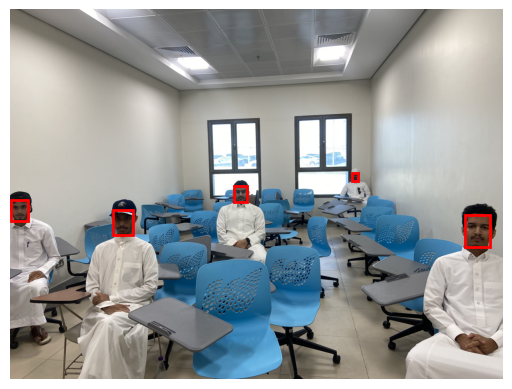

1/1 [==============================] - 0s 59ms/step


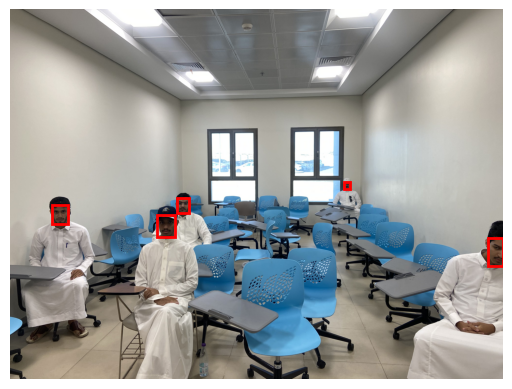

1/1 [==============================] - 0s 58ms/step


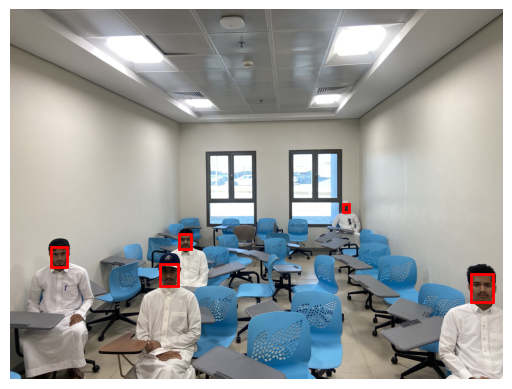

1/1 [==============================] - 0s 58ms/step


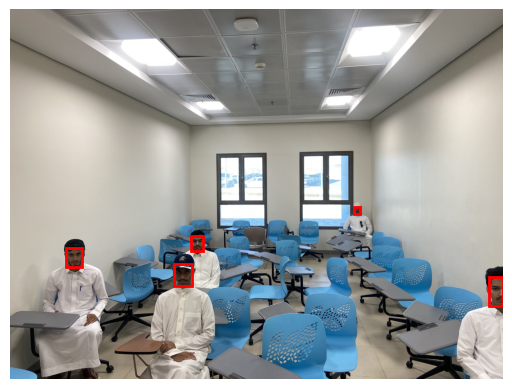

1/1 [==============================] - 0s 58ms/step


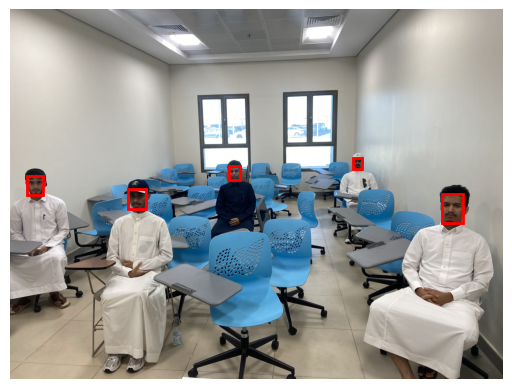

1/1 [==============================] - 0s 56ms/step


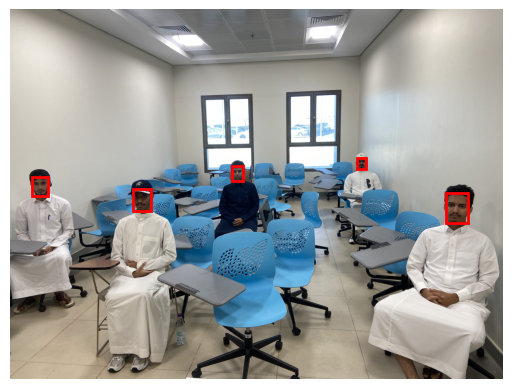

1/1 [==============================] - 0s 58ms/step


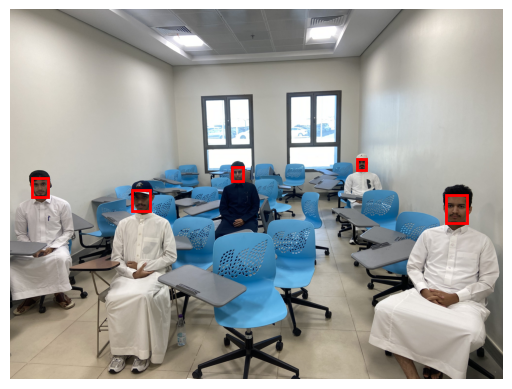

1/1 [==============================] - 0s 56ms/step


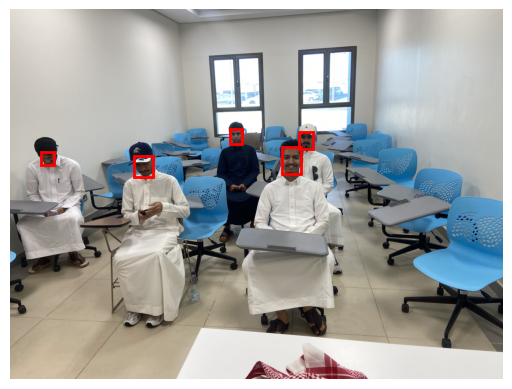

1/1 [==============================] - 0s 59ms/step


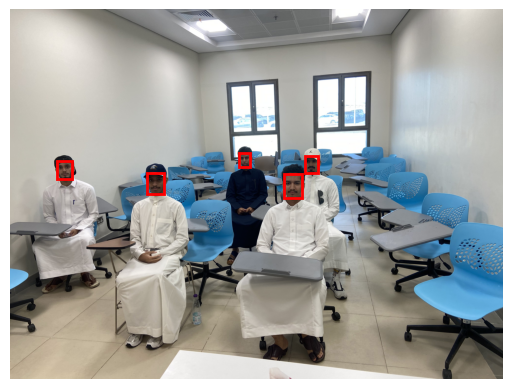

1/1 [==============================] - 0s 56ms/step


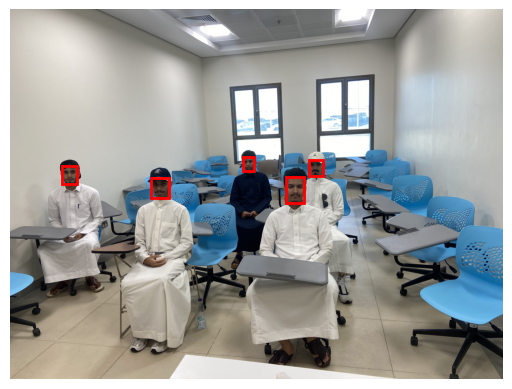

1/1 [==============================] - 0s 59ms/step
Predictions for Test Images:
IMG_0450.jpg: ['Jawad', 'Faisal', 'Raheem', 'Khaled', 'Saad']
IMG_0451.jpg: ['Jawad', 'Faisal', 'Saad', 'Raheem', 'Khaled']
IMG_0452.jpg: ['Khaled', 'Faisal', 'Saad', 'Raheem', 'Jawad']
IMG_0453.jpg: ['Faisal', 'Jawad', 'Raheem', 'Saad', 'Khaled']
IMG_0454.jpg: ['Faisal', 'Saad', 'Abdulaziz', 'Raheem', 'Khaled']
IMG_0455.jpg: ['Faisal', 'Saad', 'Abdulaziz', 'Khaled', 'Raheem']
IMG_0456.jpg: ['Faisal', 'Saad', 'Khaled', 'Raheem', 'Abdulaziz']
IMG_0457.jpg: ['Khaled', 'Abdulaziz', 'Raheem', 'Jawad', 'Faisal']
IMG_0458.jpg: ['Faisal', 'Raheem', 'Khaled', 'Saad', 'Abdulaziz']
IMG_0459.jpg: ['Faisal', 'Raheem', 'Abdulaziz', 'Saad', 'Khaled']


In [105]:
import os

# Directory containing the test images
test_images_dir = "/content/SeniorProject/CLASSROOM"

# List all image files in the directory
test_images = sorted([img for img in os.listdir(test_images_dir) if img.endswith(".jpg")])
predictions_dict = {}

for image_name in test_images:
    image_path = os.path.join(test_images_dir, image_name)  # Full path to the image

    # Detect faces
    results = detect_faces(image_path)
    cropped_faces = crop_faces(image_path, results)
    face_embeddings = get_face_embeddings(embedder, cropped_faces)

    # Predict names
    predicted_labels = model.predict(face_embeddings)
    predicted_names = [encoder.classes_[label] for label in predicted_labels]

    # Store predictions
    predictions_dict[image_name] = predicted_names

# Print predictions for all images
print("Predictions for Test Images:")
for image_name, preds in predictions_dict.items():
    print(f"{image_name}: {preds}")


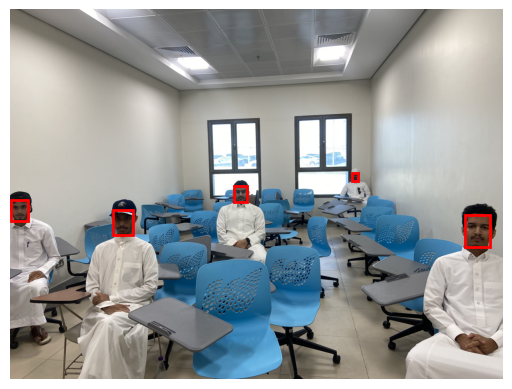

1/1 [==============================] - 0s 65ms/step
Visualizing IMG_0450.jpg with predicted names...


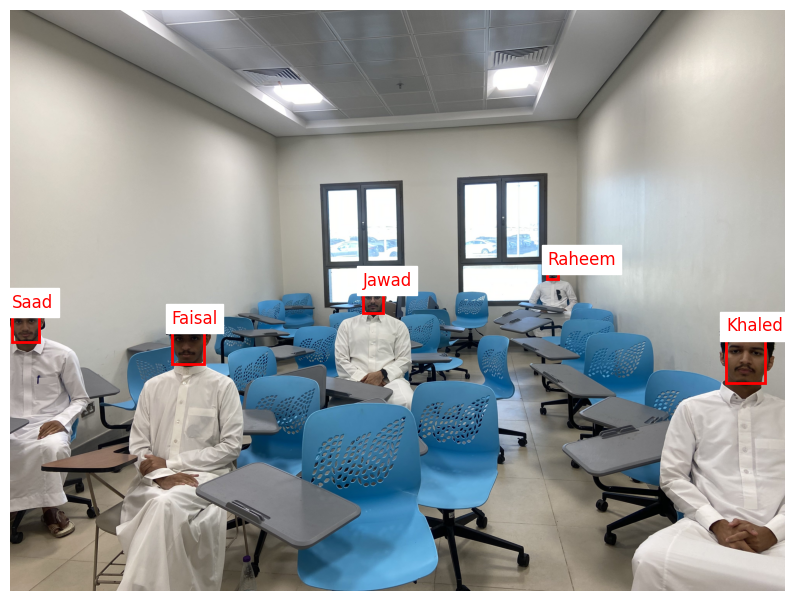

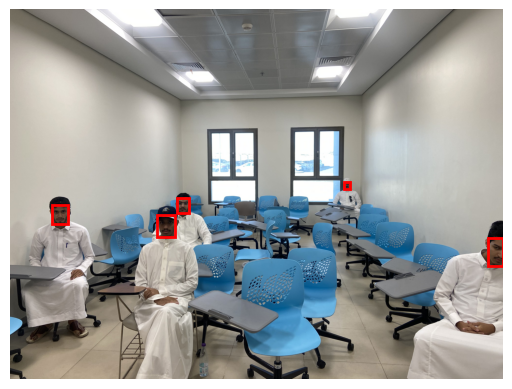

1/1 [==============================] - 0s 58ms/step
Visualizing IMG_0451.jpg with predicted names...


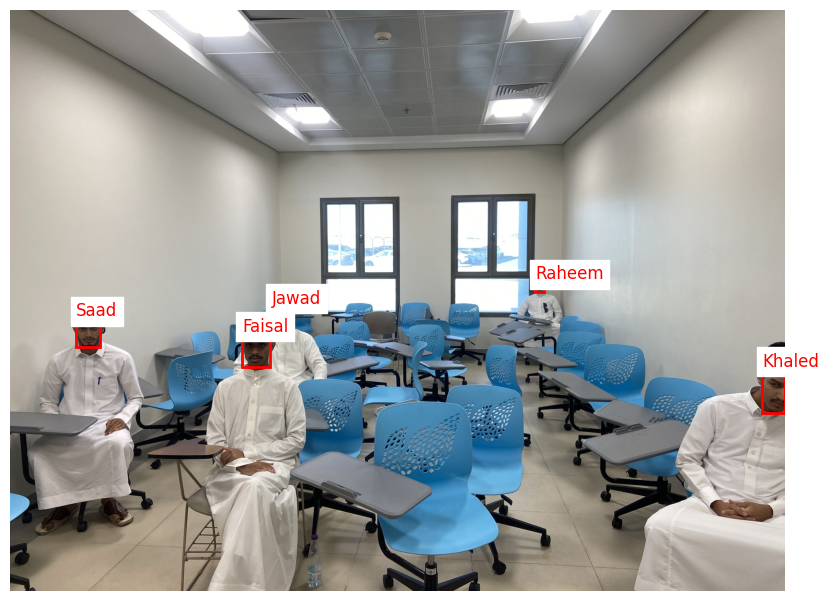

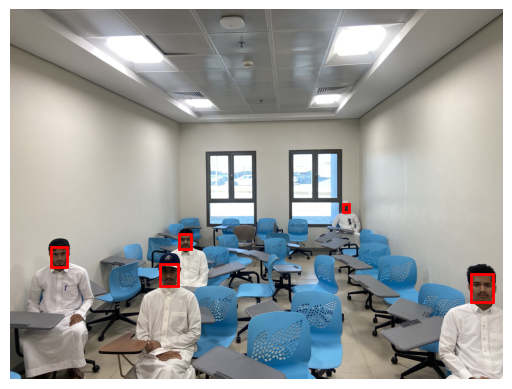

1/1 [==============================] - 0s 64ms/step
Visualizing IMG_0452.jpg with predicted names...


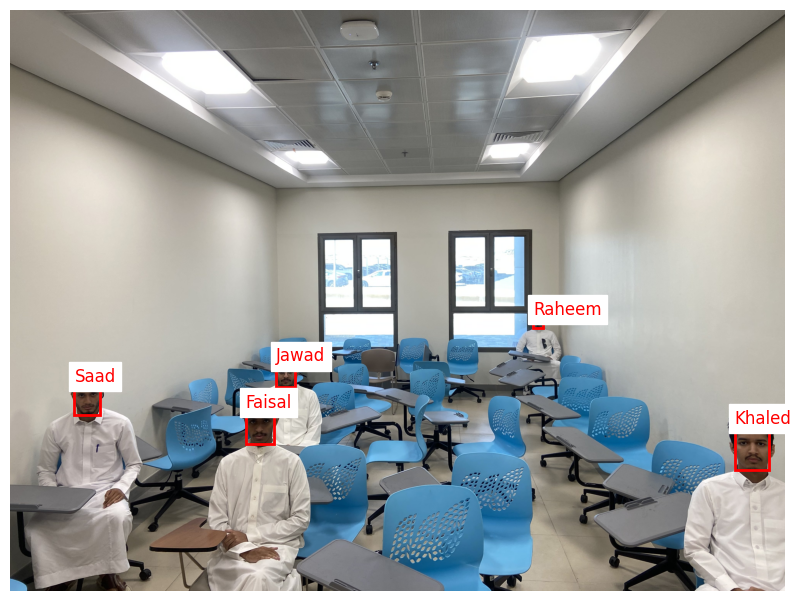

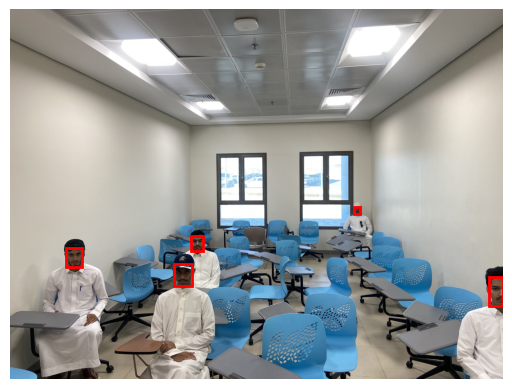

1/1 [==============================] - 0s 56ms/step
Visualizing IMG_0453.jpg with predicted names...


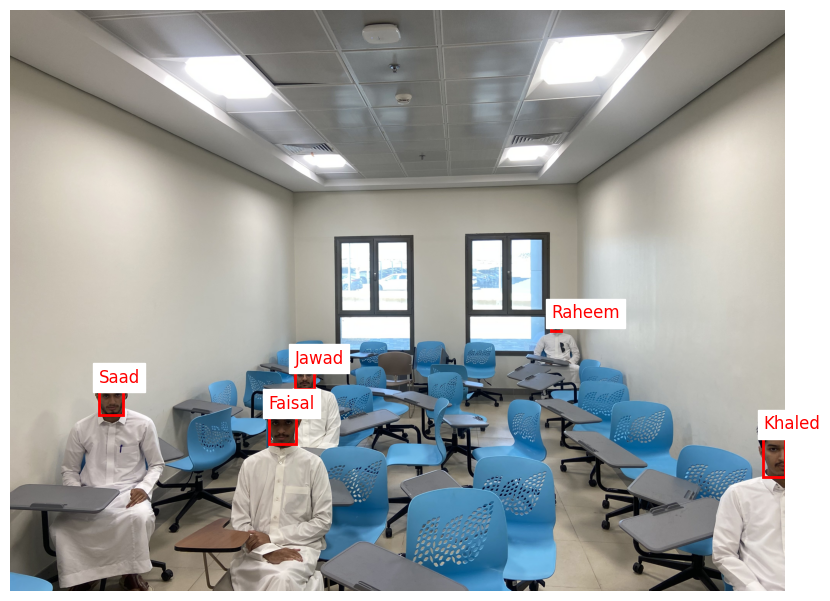

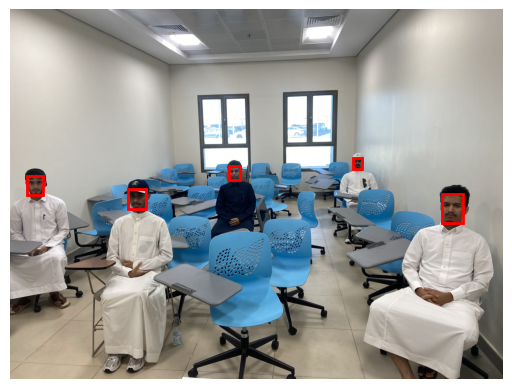

1/1 [==============================] - 0s 57ms/step
Visualizing IMG_0454.jpg with predicted names...


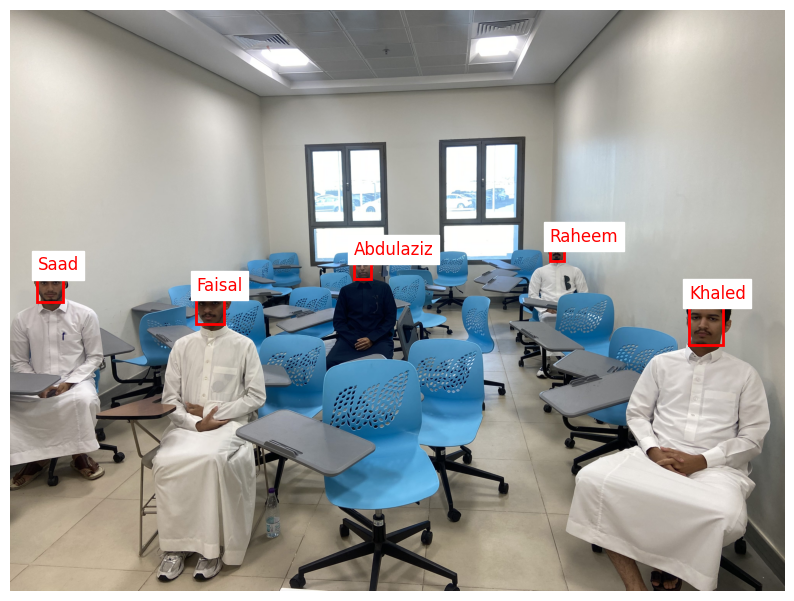

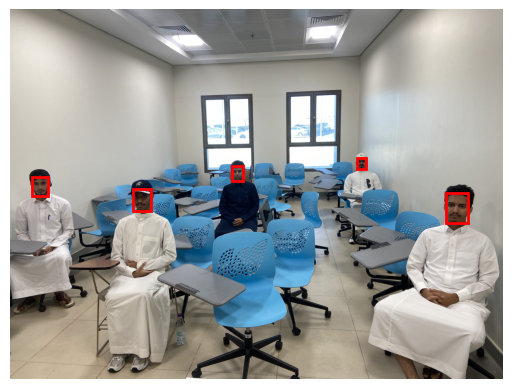

1/1 [==============================] - 0s 58ms/step
Visualizing IMG_0455.jpg with predicted names...


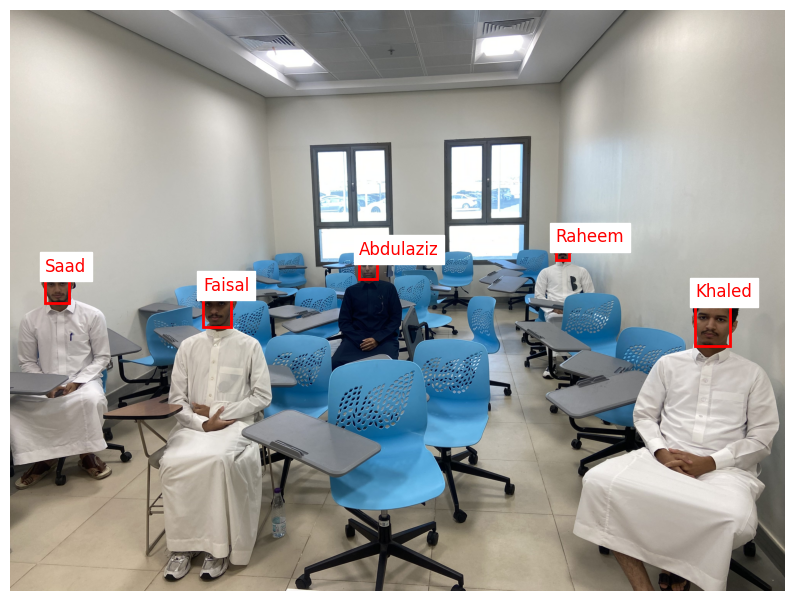

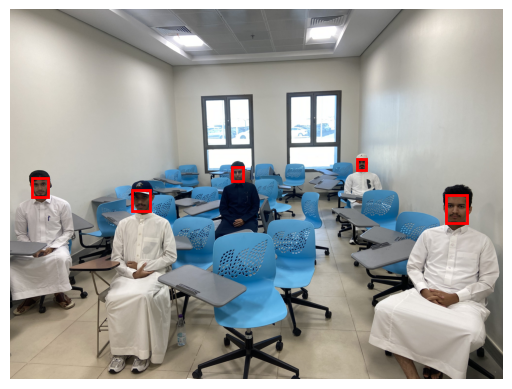

1/1 [==============================] - 0s 59ms/step
Visualizing IMG_0456.jpg with predicted names...


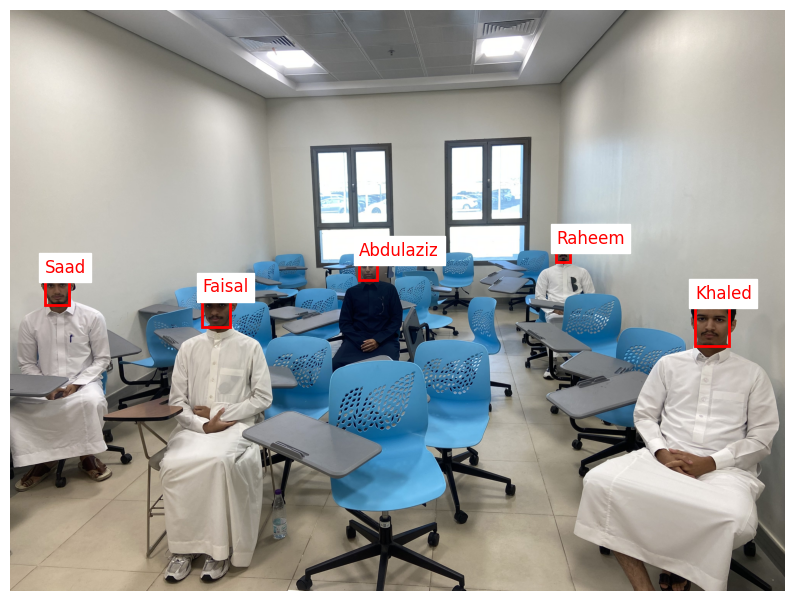

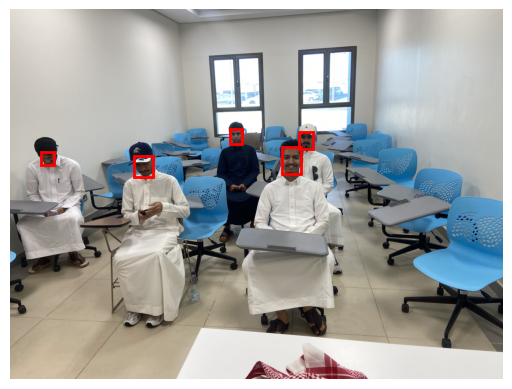

1/1 [==============================] - 0s 62ms/step
Visualizing IMG_0457.jpg with predicted names...


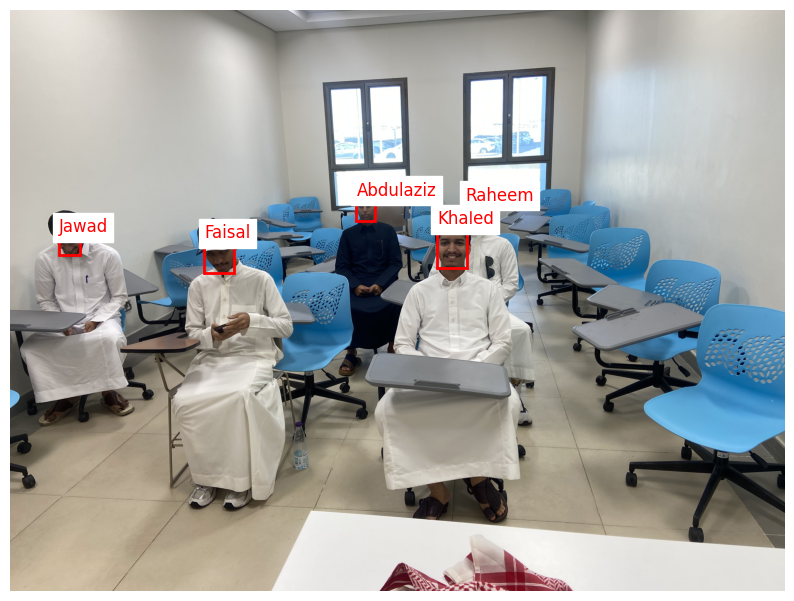

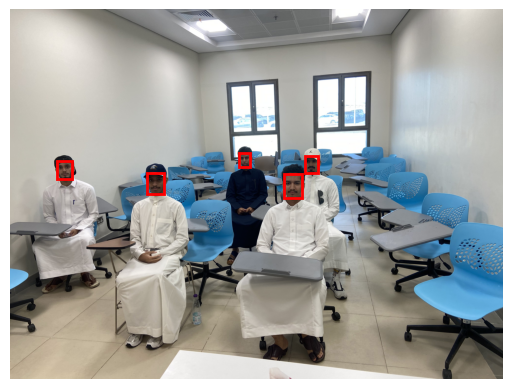

1/1 [==============================] - 0s 55ms/step
Visualizing IMG_0458.jpg with predicted names...


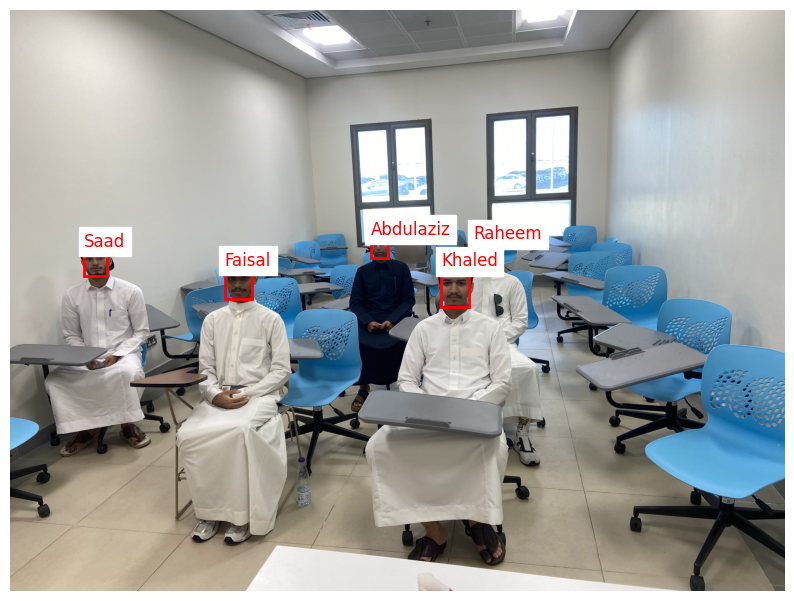

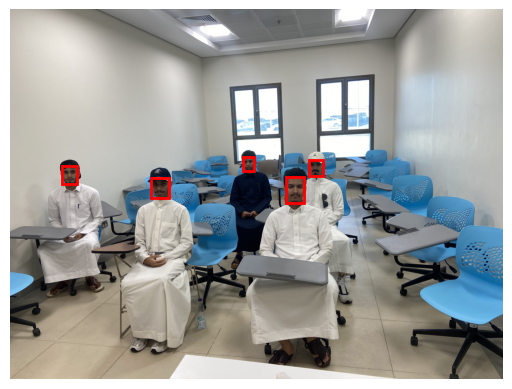

1/1 [==============================] - 0s 59ms/step
Visualizing IMG_0459.jpg with predicted names...


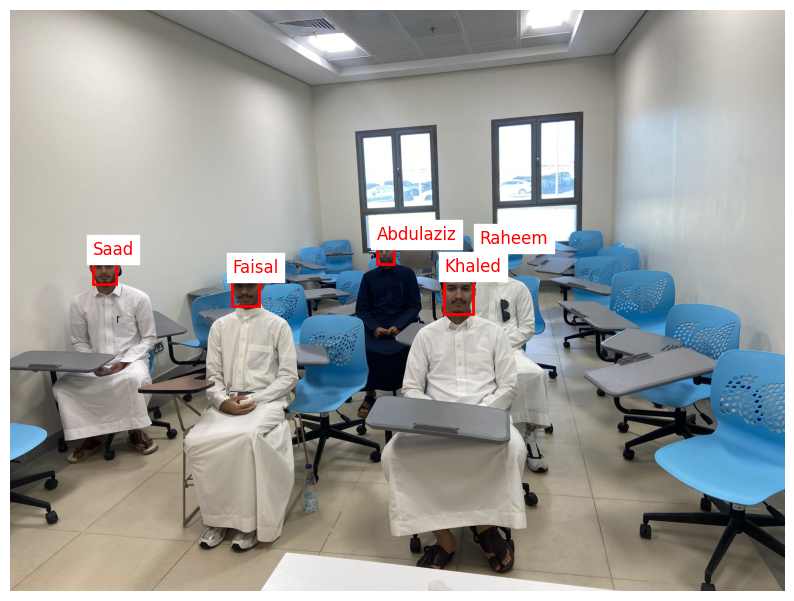

In [106]:
from matplotlib.patches import Rectangle
from PIL import Image
import matplotlib.pyplot as plt
import os

def visualize_predictions(image_path, results, predicted_names):
    # Load the image
    image = Image.open(image_path).convert('RGB')
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    # Loop through results and names to draw bounding boxes and display names
    for result, name in zip(results, predicted_names):
        # Extract bounding box coordinates
        x, y, width, height = result['box']
        x, y = abs(x), abs(y)  # Ensure no negative coordinates

        # Draw the bounding box
        rect = Rectangle((x, y), width, height, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)

        # Draw the predicted name above the bounding box
        plt.text(x, y - 10, name, color='red', fontsize=12, backgroundcolor='white')

    plt.axis('off')  # Remove axis
    plt.show()

# Iterate through each test image
for image_name in test_images:
    image_path = os.path.join("/content/SeniorProject/CLASSROOM", image_name)

    # Detect faces and predict names
    results = detect_faces(image_path)
    cropped_faces = crop_faces(image_path, results)
    face_embeddings = get_face_embeddings(embedder, cropped_faces)
    predicted_labels = model.predict(face_embeddings)
    predicted_names = [encoder.classes_[label] for label in predicted_labels]

    # Visualize the predictions
    print(f"Visualizing {image_name} with predicted names...")
    visualize_predictions(image_path, results, predicted_names)


In [110]:
# Define the actual ground truth manually
ground_truth = {
    "IMG_0450.jpg": ["Jawad", "Faisal", "Raheem", "Khaled", "Saad"],
    "IMG_0451.jpg": ["Jawad", "Faisal", "Saad", "Raheem", "Khaled"],
    "IMG_0452.jpg": ["Khaled", "Faisal", "Saad", "Raheem", "Jawad"],
    "IMG_0453.jpg": ["Faisal", "Jawad", "Raheem", "Saad", "Khaled"],
    "IMG_0454.jpg": ["Faisal", "Saad", "Abdulaziz", "Raheem", "Khaled"],
    "IMG_0455.jpg": ["Faisal", "Saad", "Abdulaziz", "Khaled", "Raheem"],
    "IMG_0456.jpg": ["Faisal", "Saad", "Khaled", "Raheem", "Abdulaziz"],
    "IMG_0457.jpg": ["Khaled", "Saad", "Raheem", "Jawad", "Faisal"],
    "IMG_0458.jpg": ["Faisal", "Raheem", "Khaled", "Saad", "Abdulaziz"],
    "IMG_0459.jpg": ["Faisal", "Raheem", "Abdulaziz", "Saad", "Khaled"]
}


In [111]:
from sklearn.metrics import accuracy_score, classification_report

# Flatten ground truth and predictions
all_ground_truth = []
all_predictions = []

for image_name in predictions_dict.keys():
    all_ground_truth.extend(ground_truth[image_name])
    all_predictions.extend(predictions_dict[image_name])

# Ensure they are aligned
assert len(all_ground_truth) == len(all_predictions), "Mismatch in ground truth and predictions length!"

# Compute accuracy
accuracy = accuracy_score(all_ground_truth, all_predictions)
print(f"Overall Accuracy: {accuracy * 100:.2f}%")

# Generate classification report
print("\nClassification Report:")
print(classification_report(all_ground_truth, all_predictions, target_names=list(set(all_ground_truth))))


Overall Accuracy: 98.00%

Classification Report:
              precision    recall  f1-score   support

      Faisal       0.83      1.00      0.91         5
      Raheem       1.00      1.00      1.00        10
   Abdulaziz       1.00      1.00      1.00         5
        Saad       1.00      1.00      1.00        10
      Khaled       1.00      1.00      1.00        10
       Jawad       1.00      0.90      0.95        10

    accuracy                           0.98        50
   macro avg       0.97      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50



Precision: 98.33%
Recall: 98.00%
F1-Score: 98.04%


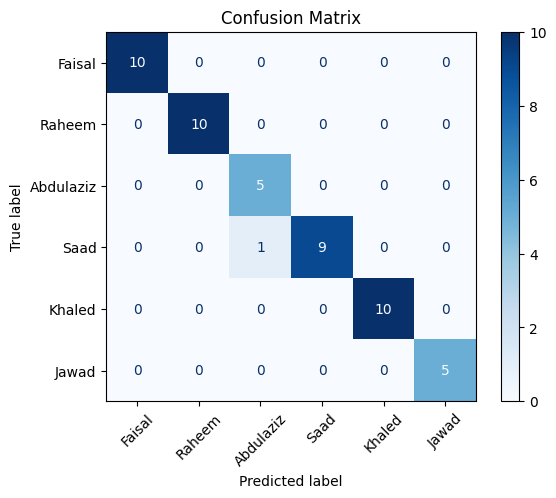

In [112]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# Precision, Recall, F1-Score
precision = precision_score(all_ground_truth, all_predictions, average='weighted')
recall = recall_score(all_ground_truth, all_predictions, average='weighted')
f1 = f1_score(all_ground_truth, all_predictions, average='weighted')

print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")

# Confusion Matrix
conf_matrix = confusion_matrix(all_ground_truth, all_predictions, labels=list(set(all_ground_truth)))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=list(set(all_ground_truth)))

# Plot confusion matrix
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()
